# Importing Libraries

In [ ]:
# utilities
import re
import hdbscan
import numpy as np
import pandas as pd
from tqdm import tqdm
from aletheia import *
from twinning import *
from bertopic import *

# plotting
from umap import UMAP
import plotly.express as px
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# nltk
from sentence_transformers import SentenceTransformer
from bertopic.vectorizers import ClassTfidfTransformer
from sklearn.feature_extraction.text import CountVectorizer

# torch
import torch
import torch.nn as nn
from typing import List, Tuple
from torch.utils.data import Dataset, DataLoader

# sklearn
import sklearn
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.linear_model import LassoCV, LinearRegression
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit
from sklearn.metrics import make_scorer, mean_squared_error, confusion_matrix, classification_report, roc_auc_score

# Importing Data

In [ ]:
DATASET_COLUMNS=['target','ids','date','flag','user','text']
DATASET_ENCODING = "ISO-8859-1"
df = pd.read_csv('twitter.csv', encoding=DATASET_ENCODING, names=DATASET_COLUMNS).sample(frac=0.015) # 0.015 * 1.6M = 240000

data=df[['text','target']]
data['target'] = data['target'].replace(4,1)
data['text']=data['text'].str.lower()

data['target'].value_counts()

1    12049
0    11951
Name: target, dtype: int64

# Preprocessing Data

In [ ]:
model = SentenceTransformer('obrizum/all-MiniLM-L6-v2')

In [ ]:
x = data['text'].values
y = data['target'].values
train_xx, test_xx, train_y, test_y = train_test_split(x, y, test_size=0.2)

train_x = model.encode(train_xx)
test_x = model.encode(test_xx)

# Logistic Regression

In [ ]:
lr = LogisticRegression().fit(train_x, train_y)

In [ ]:
print('Overall Training Accuracy = ' + str(roc_auc_score(train_y, lr.predict(train_x))))
print('Overall  Testing Accuracy = ' + str(roc_auc_score(test_y, lr.predict(test_x))))

Overall Training Accuracy = 0.7741667098998466
Overall  Testing Accuracy = 0.773114878797919


# Classes & Functions

In [ ]:
class ModelDataset(Dataset):

    def __init__(self, data: np.ndarray, labels: np.ndarray):
        super(ModelDataset, self).__init__()
        self.data = data
        self.labels = labels

    def __getitem__(self, idx) -> torch.tensor:
        return self.data[idx], self.labels[idx]

    def __len__(self) -> int:
        return len(self.data)

    def get_dataloader(self, batch_size: int, num_workers: int = 0, shuffle: bool = False, batch_first: bool = True, pin_memory: bool = False) -> object:
        batch_obj = DataLoader(self, batch_size=batch_size, shuffle=shuffle, num_workers=num_workers, pin_memory=pin_memory)
        return batch_obj


class ReLU_DNN(nn.Module):

    def __init__(self, net_size: List[Tuple]):
        super(ReLU_DNN, self).__init__()
        self.layers = []
        for size in net_size[:-1]:
            self.layers.append(nn.Linear(size[0], size[1]))
            self.layers.append(nn.ReLU())
        self.layers.append(nn.Linear(net_size[-1][0], net_size[-1][1]))
        self.net = nn.Sequential(*self.layers)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        final_output = self.net(x)
        return final_output


class Trainer():

    def __init__(self, hidden_layer_sizes: list, epochs: int, learning_rate: float, device: str, loss_fn: torch.nn.modules.loss, l1_reg: float, l2_reg: float, batch_size: int):
        self.hidden_layer_sizes = hidden_layer_sizes
        self.epochs = epochs
        self.lr = learning_rate
        self.loss_fn = loss_fn
        self.l1_lambda = l1_reg
        self.l2_lambda = l2_reg
        self.batch_size = batch_size
        self.device = device

    def validate_input(self, labels: np.ndarray) -> np.ndarray:
        if labels.ndim != 2:
            labels = np.reshape(labels, (-1, 1))
        return labels.astype(float)

    def get_data_loader(self, x: np.ndarray, y: np.ndarray, shuffle: bool = False) -> object:
        dataobj = ModelDataset(x, y)
        data_loader = dataobj.get_dataloader(batch_size=self.batch_size, shuffle=shuffle)
        return data_loader

    def init_weights(self,layer):
        if type(layer) == nn.Linear:
            nn.init.kaiming_normal_(layer.weight, mode='fan_in', nonlinearity='relu')
            nn.init.zeros_(layer.bias)

    def build_model(self, data_x: np.ndarray):
        input_size = data_x.shape[1]
        output_size = 1
        hidden_list = [input_size] + self.hidden_layer_sizes + [output_size]
        hidden_tuples = [(hidden_list[i], hidden_list[i + 1]) for i in range(len(hidden_list) - 1)]
        model = ReLU_DNN(hidden_tuples)
        self.model = model.net.double()
        self.model.apply(self.init_weights)
        if torch.cuda.is_available():
            self.model = self.model.to(device=self.device)

    def get_params(self):
        self.weights = []
        self.biases = []
        for name, params in self.model.named_parameters():
            if 'weight' in name:
                self.weights.append(torch.transpose(params, 0, 1).detach())
            elif 'bias' in name:
                self.biases.append(params.detach())

    def calc_l1reg_loss(self, loss: torch.Tensor) -> torch.Tensor:
        l1_reg = torch.tensor(0.0, dtype=torch.double, device=self.device)
        for name,params in self.model.named_parameters():
            if "weight" in name:
                l1_reg += torch.norm(params, 1)
        loss = loss + self.l1_lambda * l1_reg
        return loss

    def calc_l2reg_loss(self, loss: torch.Tensor) -> torch.Tensor:
        l2_reg = torch.tensor(0.0, dtype=torch.double, device=self.device)
        for name,params in self.model.named_parameters():
            if "weight" in name:
                l2_reg += torch.norm(params, 2)**2
        loss = loss + self.l2_lambda * l2_reg
        return loss

    def train(self, data_loader: object):
        self.model.train()
        self.loss = []
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.lr)
        for epochs in range(self.epochs):
            epoch_loss = 0
            for batch_no, train_batch in enumerate(data_loader):
                data, labels = train_batch[0].to(device=self.device).double(), train_batch[1].to(device=self.device).double()
                prediction = self.model(data)
                loss = self.loss_fn(prediction, labels)
                if self.l1_lambda > 0.0:
                    loss = self.calc_l1reg_loss(loss)
                if self.l2_lambda > 0.0:
                    loss = self.calc_l2reg_loss(loss)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
            self.loss.append(epoch_loss)
        self.get_params()


class ReluNetRegressor(Trainer):

    def __init__(self, hidden_layer_sizes: list, epochs: int, device: str, learning_rate: float = 0.01, l1_reg: float = 0, l2_reg: float = 0, batch_size: int = 100):
        super(ReluNetRegressor, self).__init__(hidden_layer_sizes=hidden_layer_sizes, epochs=epochs, learning_rate=learning_rate, device=device, loss_fn=nn.MSELoss(), l1_reg=l1_reg, l2_reg=l2_reg, batch_size=batch_size)

    def fit(self, data_x: np.ndarray, labels: np.ndarray):
        labels = self.validate_input(labels)
        self.build_model(data_x)
        data_loader = self.get_data_loader(x=data_x, y=labels, shuffle=True)
        self.train(data_loader)

    def perform_eval(self, data_x: np.ndarray, labels: np.ndarray) -> float:
        self.model.eval()
        self.batch_size = data_x.shape[0]
        labels = self.validate_input(labels)
        data_loader = self.get_data_loader(x=data_x, y=labels, shuffle=False)
        for batch_no, val_batch in enumerate(data_loader):
            data, labels = val_batch[0].to(device=self.device).double(), val_batch[1].to(device=self.device).double()
            with torch.no_grad():
                prediction = self.model(data)
        error = torch.sum(torch.pow(prediction - labels, 2)).item()
        y_sum = torch.sum(torch.pow(labels - torch.mean(labels), 2)).item()
        r2_score = 1 - error / (y_sum)
        return r2_score

    def predict(self, data_x: np.ndarray) -> np.ndarray:
        self.model.eval()
        data = torch.from_numpy(data_x).to(device=self.device)
        with torch.no_grad():
            prediction = self.model(data.double())
        return prediction.cpu().numpy()


class ReluNetClassifier(Trainer):

    def __init__(self, hidden_layer_sizes: list, epochs: int, device: str, learning_rate: float = 0.01, l1_reg: float = 0, l2_reg: float = 0, batch_size: int = 100):
        super(ReluNetClassifier, self).__init__(hidden_layer_sizes=hidden_layer_sizes, epochs=epochs, learning_rate=learning_rate, device=device, loss_fn=nn.BCEWithLogitsLoss(), l1_reg=l1_reg, l2_reg=l2_reg, batch_size=batch_size)

    def fit(self, data_x: np.ndarray, labels: np.ndarray):
        labels = self.validate_input(labels)
        self.build_model(data_x)
        data_loader = self.get_data_loader(x=data_x, y=labels, shuffle=True)
        self.train(data_loader)

    def perform_eval(self, data_x: np.ndarray, labels: np.ndarray) -> float:
        self.model.eval()
        self.batch_size = data_x.shape[0]
        labels = self.validate_input(labels)
        data_loader = self.get_data_loader(x=data_x, y=labels, shuffle=False)
        for batch_no, val_batch in enumerate(data_loader):
            data, labels = val_batch[0].to(device=self.device).double(), val_batch[1].to(device=self.device).double()
            with torch.no_grad():
                prediction = self.model(data)
                pred_labels = torch.round(torch.sigmoid(prediction))
                correct_results_sum = (pred_labels == labels).sum().float()
                acc = correct_results_sum / labels.shape[0]
                acc = torch.round(acc * 100)
        return acc.item()

    def predict_proba(self, data_x: np.ndarray) -> np.ndarray:
        self.model.eval()
        data = torch.from_numpy(data_x).to(device=self.device)
        with torch.no_grad():
            prediction = self.model(data.double())
            proba = torch.sigmoid(prediction)
        return proba

    def predict(self, data_x: np.ndarray) -> np.ndarray:
        proba = np.round(mlp.predict_proba(data_x), 0)
        return proba

#Reproducibility seed
def set_seed(seed):
    if torch.cuda.is_available():
        torch.backends.cudnn.benchmark = False
        torch.backends.cudnn.deterministic = True
        torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

In [ ]:
class HFunc():

    def __init__(self, model, clf):
        self.model = model
        self.clf = clf
        self.weights = [item.numpy() for item in self.model.weights]
        self.biases = [item.numpy() for item in self.model.biases]

        try:
            self.sample_idx = self.clf.sample_idx_by_llms
            self.size = self.clf.nllms

        except:
            self.sample_idx = self.clf.sample_idx_by_merge
            self.size = self.clf.n_active_clusters

    def get_train_L2(self, data_x:np.ndarray, data_y:np.ndarray):

        # output of 1st layer
        ip = train_x

        for i in range(len(self.weights)-1):
            hidden = ip@self.weights[i]+self.biases[i]
            for j in range(len(hidden)):
                hidden[j] = [max(0.0, x) for x in hidden[j]]
            ip = hidden

        # concat 1st layer output and input
        data_x_df = pd.DataFrame(np.concatenate((train_x, hidden), axis=1))
        data_y_df = pd.DataFrame(train_y)

        seg_dfs_x = []
        seg_dfs_y = []

        # segmenting by clusters
        for i in range(len(self.sample_idx)):
            seg_dfs_x.append(data_x_df.iloc[self.sample_idx[i]])
            seg_dfs_y.append(data_y_df.iloc[self.sample_idx[i]])

        for i in range(len(seg_dfs_x)):
            seg_dfs_x[i] = seg_dfs_x[i].to_numpy()
            seg_dfs_y[i] = seg_dfs_y[i].to_numpy()

        data_x_df['Cluster'] = ''
        data_y_df['Cluster'] = ''

        for i in range(len(self.sample_idx)):
            data_x_df.Cluster.iloc[self.sample_idx[i]] = i
            data_y_df.Cluster.iloc[self.sample_idx[i]] = i

        return seg_dfs_x, seg_dfs_y, data_x_df, data_y_df

    def get_test_L2(self, data_x:np.ndarray, data_y:np.ndarray):

        # output of 1st layer
        ip = test_x

        for i in range(len(self.weights)-1):
            hidden = ip@self.weights[i]+self.biases[i]
            for j in range(len(hidden)):
                hidden[j] = [max(0.0, x) for x in hidden[j]]
            ip = hidden

        # concat 1st layer output and input
        data_x_df = pd.DataFrame(np.concatenate((test_x, hidden), axis=1))
        data_y_df = pd.DataFrame(test_y)

        # looking up cluster id for mse calc.
        look = self.clf.lookup_table(test_x)
        look_ids = [None]*(max(look)+1)

        for i in range(max(look)+1):
            look_ids[i] = [j for j, value in enumerate(look) if value == i]

        seg_dfs_x = []
        seg_dfs_y = []

        for i in range(max(look)+1):
            seg_dfs_x.append(data_x_df.iloc[look_ids[i]])
            seg_dfs_y.append(data_y_df.iloc[look_ids[i]])

        for i in range(max(look)+1):
            seg_dfs_x[i] = seg_dfs_x[i].to_numpy()
            seg_dfs_y[i] = seg_dfs_y[i].to_numpy()

        data_x_df['Cluster'] = ''
        data_y_df['Cluster'] = ''

        for i in range(max(look)+1):
            data_x_df.Cluster.iloc[look_ids[i]] = i
            data_y_df.Cluster.iloc[look_ids[i]] = i

        return seg_dfs_x, seg_dfs_y, data_x_df, data_y_df

    def get_regs(self, seg_x:np.ndarray, seg_y:np.ndarray):
        regs = [None] * self.size

        for i in range(self.size):
            regs[i] = MLPClassifier(hidden_layer_sizes=1)
            regs[i].fit(seg_x[i][:,:], seg_y[i])

        return regs

    def get_classifier(self, dfs_x:np.ndarray, dfs_y:np.ndarray):
        mlc = MLPClassifier(hidden_layer_sizes=[100], max_iter=100, learning_rate_init=0.001, batch_size=100)
        mlc.fit(dfs_x.iloc[:,:-1].values, dfs_x.iloc[:,-1].values.astype('int64'))

        return mlc

    def get_pro(self, dfs_x:np.ndarray, dfs_y:np.ndarray, regs, mlc):
        outputs = [None] * self.size

        for i in range(self.size):
            outputs[i] = regs[i].predict(dfs_x.iloc[:,:-1].values)

        outputs = np.array(outputs).T
        outputs = np.clip(outputs, 0, 1, out=outputs)
        probs = mlc.predict_proba(dfs_x.iloc[:,:-1].values)

        return probs, outputs

In [ ]:
def exp_var(train_x, test_x, thresh=0.9):

  pca = PCA(n_components=None)
  X_train = pca.fit_transform(train_x)
  X_test = pca.transform(test_x)

  exp_var = pca.explained_variance_ratio_
  sum = 0

  for i in range(len(exp_var)):
    sum = sum + exp_var[i]
    if sum >= thresh:
      return i, X_train[:, :i], X_test[:, :i]

def dd_cluster(X_train, thresh=10, plot=False):

  hc = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='ward', distance_threshold=thresh).fit(X_train)
  hc = AgglomerativeClustering(n_clusters=hc.n_clusters_, affinity='euclidean', linkage='ward').fit(X_train)

  if plot == True:
    dendogram = sch.dendrogram(sch.linkage(X_train, method='ward'))
    plt.title('Dendogram')
    plt.show()

  return hc

def c_tf_idf(documents, m, ngram_range=(1, 1)):
    count = CountVectorizer(ngram_range=ngram_range, stop_words="english").fit(documents)
    t = count.transform(documents).toarray()
    w = t.sum(axis=1)
    tf = np.divide(t.T, w)
    sum_t = t.sum(axis=0)
    idf = np.log(np.divide(m, sum_t)).reshape(-1, 1)
    tf_idf = np.multiply(tf, idf)
    return tf_idf, count

def extract_top_n_words_per_topic(tf_idf, count, docs_per_topic, n=20):
    words = count.get_feature_names_out()
    labels = list(docs_per_topic.Topic)
    tf_idf_transposed = tf_idf.T
    indices = tf_idf_transposed.argsort()[:, -n:]
    top_n_words = {label: [(words[j], tf_idf_transposed[i][j]) for j in indices[i]][::-1] for i, label in enumerate(labels)}
    return top_n_words

def extract_topic_sizes(df):
    topic_sizes = (df.groupby(['Topic'])
                     .Doc
                     .count()
                     .reset_index()
                     .rename({"Topic": "Topic", "Doc": "Size"}, axis='columns')
                     .sort_values("Size", ascending=False))
    return topic_sizes

# PCA & Clustering

In [ ]:
i, X_train, X_test = exp_var(train_x, test_x, thresh=0.9)
hc = dd_cluster(X_train, thresh=10, plot=True)

In [ ]:
X_train = pd.DataFrame(X_train)
X_test = pd.DataFrame(X_test)
Y_train = pd.DataFrame(train_y)
Y_test = pd.DataFrame(test_y)

X_train['Cluster'] = hc.labels_
Y_train['Cluster'] = hc.labels_

features = X_train.iloc[:,:-1]
umap_2d = UMAP(n_components=2, init='random')
projections = umap_2d.fit_transform(features)

fig = px.scatter(projections, x=0, y=1, color=X_train.Cluster, labels={'color':'Cluster'}, width=600, height=600)
fig.show()

# Running PCA on each cluster followed by separate classifiers

In [ ]:
df_segx = []
df_segy = []

for j in range(X_train.Cluster.nunique()):
  df_segx.append(X_train[X_train['Cluster']==j])
  df_segy.append(Y_train[Y_train['Cluster']==j])

In [ ]:
j = []

df_trainx = []
df_trainy = []
df_testx = []
df_testy = []

for k in range(X_train.Cluster.nunique()):

  pca = PCA(n_components=None)
  A = pca.fit_transform(df_segx[k].iloc[:,:-1])
  B = pca.transform(X_test)

  exp_var = pca.explained_variance_ratio_
  sum = 0

  for i in range(len(exp_var)):
    sum = sum + exp_var[i]

    if sum >= 0.9:
      j.append(i)

      df_trainx.append(A[:, :i])
      df_trainy.append(df_segy[k])
      df_testx.append(B[:, :i])
      df_testy.append(Y_test)
      break

In [ ]:
classifiers = [None] * X_train.Cluster.nunique()

for k in range(X_train.Cluster.nunique()):
  classifiers[k] = MLPClassifier(hidden_layer_sizes=1, max_iter=1000)
  classifiers[k].fit(df_trainx[k][:,:], df_trainy[k].iloc[:,:1])

In [ ]:
G1 = []
G2 = []
wts = []

for k in range(X_train.Cluster.nunique()):
  G1.append(roc_auc_score(df_trainy[k].iloc[:,:1], classifiers[k].predict(df_trainx[k][:,:])))
  G2.append(roc_auc_score(df_testy[k].iloc[:,:1], classifiers[k].predict(df_testx[k][:,:])))

  wts.append(X_train[X_train['Cluster']==k].shape[0])

In [ ]:
for k in range(X_train.Cluster.nunique()):
  print('Training accuracy in cluster ' + str(k+1) + ' = ' + str(G1[k]))
  print('Testing accuracy in cluster ' +  str(k+1) + ' = ' + str(G2[k]))
  print('--------------------------------------------------------')

print('--------------------------------------------------------')
print('Overall Training Accuracy = ' + str(np.sum([a*b for a,b in zip(wts,G1)])/X_train.shape[0]))
print('Overall  Testing Accuracy = ' + str(np.sum([a*b for a,b in zip(wts,G2)])/X_train.shape[0]))

Training accuracy in cluster 1 = 0.7721022765829939
Testing accuracy in cluster 1 = 0.7200528078390673
--------------------------------------------------------
Training accuracy in cluster 2 = 0.7791034508860226
Testing accuracy in cluster 2 = 0.7624407891583463
--------------------------------------------------------
Training accuracy in cluster 3 = 0.7770629403697924
Testing accuracy in cluster 3 = 0.7114934156918888
--------------------------------------------------------
Training accuracy in cluster 4 = 0.7553457094702704
Testing accuracy in cluster 4 = 0.7324498335948717
--------------------------------------------------------
Training accuracy in cluster 5 = 0.7868491814994035
Testing accuracy in cluster 5 = 0.7153044786632572
--------------------------------------------------------
Training accuracy in cluster 6 = 0.7906103286384977
Testing accuracy in cluster 6 = 0.6991271285164415
--------------------------------------------------------
Training accuracy in cluster 7 = 0.80720

# ReLU Net Classifier

In [ ]:
train_x = X_train
test_x = X_test

In [ ]:
set_seed(0)

mlp = ReluNetClassifier(hidden_layer_sizes=[81], epochs=100, device="cpu", learning_rate=0.001, l1_reg=0.0001, batch_size=100)
mlp.fit(train_x, train_y)

coefs = [item.numpy() for item in mlp.weights]
intercepts = [item.numpy() for item in mlp.biases]

clf = UnwrapperClassifier(coefs, intercepts)
clf.fit(train_x, train_y)
clf.summary()

/usr/local/lib/python3.9/dist-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.9/dist-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Count,Response Mean,Response Std,Local AUC,Global AUC
0,6.0,0.000000,0.00000,NaN,0.759865
1,4.0,1.000000,0.00000,NaN,0.814036
2,4.0,0.000000,0.00000,NaN,0.833025
3,3.0,1.000000,0.00000,NaN,0.827805
4,3.0,0.666667,0.57735,1.0,0.833106
...,...,...,...,...,...
19052,1.0,0.000000,NaN,NaN,0.788804
19053,1.0,0.000000,NaN,NaN,0.766801
19054,1.0,0.000000,NaN,NaN,0.760626
19055,1.0,0.000000,NaN,NaN,0.778599


In [ ]:
datanum = train_x.shape[0]
indices = np.arange(datanum)
idx1, idx2 = train_test_split(indices, test_size=0.2)
val_fold = np.ones((len(indices)))
val_fold[idx1] = -1

grid = GridSearchCV(MergerClassifier(unwrapper=None, weights=coefs, biases=intercepts, refit_model=LogisticRegression(),
                                     min_samples=np.round(train_x.shape[0]*0.1), n_neighbors=10),
                                     param_grid={"n_clusters": [2, 3, 4, 5, 10]},
                                     scoring={"auc": make_scorer(roc_auc_score, needs_proba=True)},
                                     cv=PredefinedSplit(val_fold), refit="auc", n_jobs=-1, error_score=np.nan)
grid.fit(train_x, train_y)
clf_merge = grid.best_estimator_
clf_merge.summary()

/usr/local/lib/python3.9/dist-packages/numpy/core/_methods.py:264: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.9/dist-packages/numpy/core/_methods.py:256: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,Count,Response Mean,Response Std,Local AUC,Global AUC
0,10216.0,0.337803,0.472984,0.823244,0.840538
1,8984.0,0.684439,0.464765,0.838430,0.847486


# Training Linear Regressors for Clusters

In [ ]:
funcs = HFunc(mlp, clf_merge)
seg_x, seg_y, dfs_x, dfs_y = funcs.get_train_L2(train_x, train_y)
testseg_x, testseg_y, testdfs_x, testdfs_y = funcs.get_test_L2(train_x, train_y)
regs = funcs.get_regs(seg_x, seg_y)

In [ ]:
for i in range(clf_merge.n_active_clusters):
  print(f'Layer 1: Train Accuracy from cluster {i} = {roc_auc_score(seg_y[i], mlp.predict(seg_x[i][:, :train_x[0].shape[0]]))}')
  print(f'Layer 1:  Test Accuracy from cluster {i} = {roc_auc_score(testseg_y[i], mlp.predict(testseg_x[i][:, :train_x[0].shape[0]]))}')
  print(f'Layer 2: Train Accuracy from cluster {i} = {roc_auc_score(seg_y[i], regs[i].predict(seg_x[i][:,:]))}')
  print(f'Layer 2:  Test Accuracy from cluster {i} = {roc_auc_score(testseg_y[i], regs[i].predict(testseg_x[i][:,:]))}')
  print('-------------------------------------------------------------')

print('-------------------------------------------------------------')
print('Overall Training Accuracy = ' + str((roc_auc_score(seg_y[i], mlp.predict(seg_x[i][:, :train_x[0].shape[0]]))*10901+roc_auc_score(seg_y[i], regs[i].predict(seg_x[i][:,:]))*8299)/19200))
print('Overall  Testing Accuracy = ' + str((roc_auc_score(testseg_y[i], mlp.predict(testseg_x[i][:, :train_x[0].shape[0]]))*10901+roc_auc_score(testseg_y[i], regs[i].predict(testseg_x[i][:,:]))*8299)/19200))

Layer 1: Train Accuracy from cluster 0 = 0.7929058556674448
Layer 1:  Test Accuracy from cluster 0 = 0.718349632823317
Layer 2: Train Accuracy from cluster 0 = 0.8003912873353334
Layer 2:  Test Accuracy from cluster 0 = 0.6962554988870778
-------------------------------------------------------------
Layer 1: Train Accuracy from cluster 1 = 0.7676336583313328
Layer 1:  Test Accuracy from cluster 1 = 0.6991634491634492
Layer 2: Train Accuracy from cluster 1 = 0.8098009942971184
Layer 2:  Test Accuracy from cluster 1 = 0.7088135213135214
-------------------------------------------------------------
-------------------------------------------------------------
Overall Training Accuracy = 0.7858600500594607
Overall  Testing Accuracy = 0.703334592328733


# Training Classifier

In [ ]:
mlc = funcs.get_classifier(dfs_x, dfs_y)

In [ ]:
outputs = [None] * clf_merge.n_active_clusters

for i in range(clf_merge.n_active_clusters):
    outputs[i] = regs[i].predict(dfs_x.iloc[:,:-1].values)

outputs = np.array(outputs).T
outputs = np.clip(outputs, 0, 1, out=outputs)
probs = mlc.predict_proba(dfs_x.iloc[:,:-1].values)

fp_train = (outputs*probs).sum(axis=1)

In [ ]:
outputs = [None] * clf_merge.n_active_clusters

for i in range(clf_merge.n_active_clusters):
    outputs[i] = regs[i].predict(testdfs_x.iloc[:,:-1].values)

outputs = np.array(outputs).T
outputs = np.clip(outputs, 0, 1, out=outputs)
probs = mlc.predict_proba(testdfs_x.iloc[:,:-1].values)

fp_test = (outputs*probs).sum(axis=1)

In [ ]:
for i in range(clf_merge.n_active_clusters):
  print(f'Layer 1: Train Accuracy from cluster {i} = {roc_auc_score(seg_y[i], mlp.predict(seg_x[i][:, :train_x[0].shape[0]]))}')
  print(f'Layer 1:  Test Accuracy from cluster {i} = {roc_auc_score(testseg_y[i], mlp.predict(testseg_x[i][:, :train_x[0].shape[0]]))}')
  print(f'Layer 2: Train Accuracy from cluster {i} = {roc_auc_score(np.rint(fp_train[dfs_y[dfs_y["Cluster"]==i].index]), dfs_y[dfs_y["Cluster"]==i][0])}')
  print(f'Layer 2:  Test Accuracy from cluster {i} = {roc_auc_score(np.rint(fp_test[testdfs_y[testdfs_y["Cluster"]==i].index]), testdfs_y[testdfs_y["Cluster"]==i][0])}')
  print('-------------------------------------------------------------')

print('-------------------------------------------------------------')
print('Overall Training Accuracy = ' + str((roc_auc_score(seg_y[i], mlp.predict(seg_x[i][:, :train_x[0].shape[0]]))*10901+roc_auc_score(np.rint(fp_train[dfs_y[dfs_y["Cluster"]==i].index]), dfs_y[dfs_y["Cluster"]==i][0])*8299)/19200))
print('Overall  Testing Accuracy = ' + str((roc_auc_score(testseg_y[i], mlp.predict(testseg_x[i][:, :train_x[0].shape[0]]))*10901+roc_auc_score(np.rint(fp_test[testdfs_y[testdfs_y["Cluster"]==i].index]), testdfs_y[testdfs_y["Cluster"]==i][0])*8299)/19200))

Layer 1: Train Accuracy from cluster 0 = 0.7929058556674448
Layer 1:  Test Accuracy from cluster 0 = 0.718349632823317
Layer 2: Train Accuracy from cluster 0 = 0.8152429389669931
Layer 2:  Test Accuracy from cluster 0 = 0.715839346502749
-------------------------------------------------------------
Layer 1: Train Accuracy from cluster 1 = 0.7676336583313328
Layer 1:  Test Accuracy from cluster 1 = 0.6991634491634492
Layer 2: Train Accuracy from cluster 1 = 0.8294032725387234
Layer 2:  Test Accuracy from cluster 1 = 0.725078162389913
-------------------------------------------------------------
-------------------------------------------------------------
Overall Training Accuracy = 0.7943329306389961
Overall  Testing Accuracy = 0.7103648140106588


# Understanding Weights

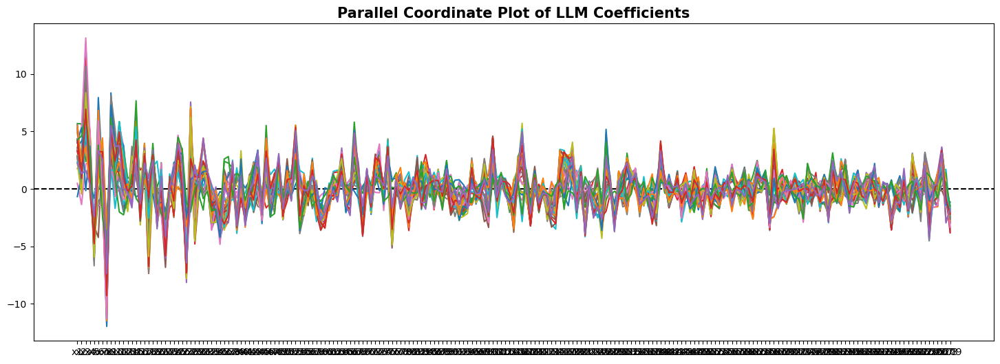

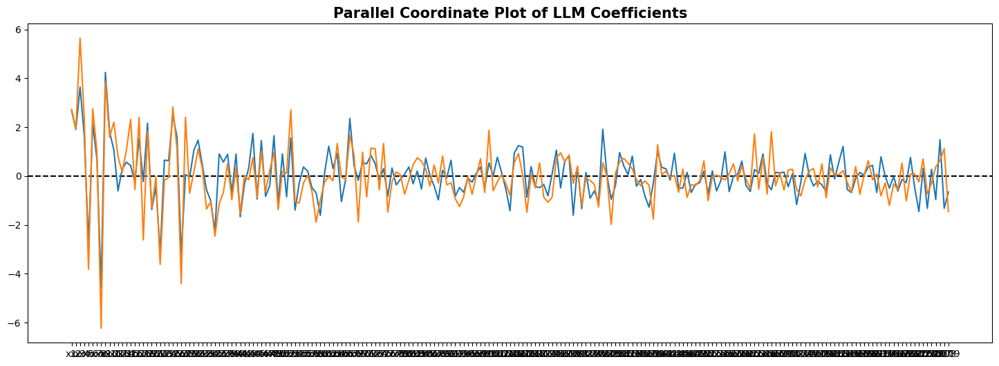

In [ ]:
fig = clf.pc_plot(figsize=(18,6))
fig = clf_merge.pc_plot(figsize=(18,6))

# K-Means Clustering

In [ ]:
kmeans = KMeans(n_clusters=clf_merge.n_active_clusters, init='k-means++')
kmeans.fit(dfs_x.iloc[:,:-1])
df_k = dfs_x.copy()
df_k['Cluster_k'] = kmeans.labels_

In [ ]:
features = df_k.iloc[:,:-2]
umap_2d = UMAP(n_components=2, init='random')
projections = umap_2d.fit_transform(features)

fig = px.scatter(projections, x=0, y=1, color=df_k.Cluster_k, labels={'color':'Cluster_k'}, width=600, height=600)
fig.show()

# BERTopic

In [ ]:
clusterable_embedding = UMAP(n_neighbors=10, min_dist=0.0, n_components=2, metric='cosine', random_state=0).fit_transform(train_x)
labels = hdbscan.HDBSCAN(min_cluster_size=100, metric='euclidean', cluster_selection_method='eom').fit_predict(clusterable_embedding)

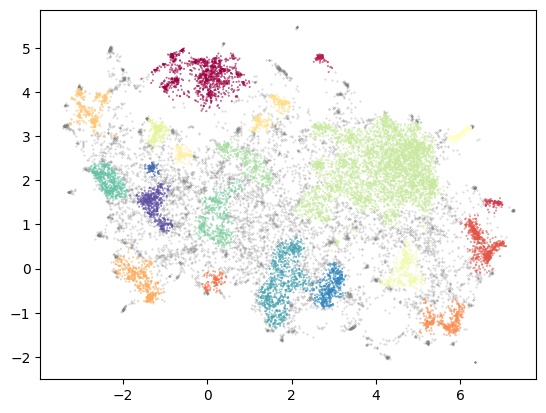

In [ ]:
clustered = (labels >= 0)
plt.scatter(clusterable_embedding[~clustered, 0],
            clusterable_embedding[~clustered, 1],
            color=(0.5, 0.5, 0.5),
            s=0.1,
            alpha=0.5)
plt.scatter(clusterable_embedding[clustered, 0],
            clusterable_embedding[clustered, 1],
            c=labels[clustered],
            s=0.1,
            cmap='Spectral');

In [ ]:
docs = train_xx.tolist()

cluster = hdbscan.HDBSCAN(min_cluster_size=100, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
umap_model = UMAP(n_neighbors=10, min_dist=0.0, n_components=2, metric='cosine', random_state=0)
vectorizer_model = CountVectorizer(ngram_range=(1, 3),stop_words="english")
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)

topic_model = BERTopic(hdbscan_model=cluster, embedding_model=model, umap_model=umap_model,
                       vectorizer_model=vectorizer_model, calculate_probabilities=True, ctfidf_model=ctfidf_model, nr_topics='auto', verbose=True)
topics, probs = topic_model.fit_transform(docs, train_x)

2023-05-30 10:23:31,555 - BERTopic - Reduced dimensionality
2023-05-30 10:23:35,940 - BERTopic - Clustered reduced embeddings
2023-05-30 10:23:40,058 - BERTopic - Reduced number of topics from 22 to 22


In [ ]:
topic_model.visualize_topics()

In [ ]:
topic_model.visualize_documents(docs)

In [ ]:
topic_model.visualize_hierarchical_documents(docs, topic_model.hierarchical_topics(docs))

100%|██████████| 20/20 [00:01<00:00, 14.30it/s]


In [ ]:
topic_model.visualize_hierarchy()

In [ ]:
topic_model.get_topic_tree(topic_model.hierarchical_topics(docs))

100%|██████████| 20/20 [00:00<00:00, 36.16it/s]


'.\n├─■──ng_½i_lang_que_ang ── Topic: 15\n└─just_lol_work_good_love\n     ├─just_lol_work_love_good\n     │    ├─twitter_lol_thanks_quot_love\n     │    │    ├─iphone_phone_blog_pic_pics\n     │    │    │    ├─■──iphone_phone_apple_3g_mac ── Topic: 9\n     │    │    │    └─■──blog_pic_pics_picture_photo ── Topic: 12\n     │    │    └─twitter_thanks_lol_love_quot\n     │    │         ├─■──twitter_tweet_tweets_tweeting_account ── Topic: 3\n     │    │         └─thanks_lol_love_quot_know\n     │    │              ├─thanks_lol_know_love_sorry\n     │    │              │    ├─■──movie_watching_watch_concert_awards ── Topic: 2\n     │    │              │    └─■──thanks_lol_sorry_know_thank ── Topic: 0\n     │    │              └─■──song_listening_music_songs_album ── Topic: 8\n     │    └─work_sleep_rain_today_day\n     │         ├─work_sleep_rain_day_today\n     │         │    ├─rain_weather_raining_food_sun\n     │         │    │    ├─food_dinner_eat_coffee_eating\n     │         │    │   

In [ ]:
topic_model.visualize_barchart()

In [ ]:
topic_model.visualize_heatmap()

In [ ]:
topic_model.visualize_distribution(probs[0])

In [ ]:
topic_model.visualize_topics_per_class(topic_model.topics_per_class(docs, classes=train_y))

2it [00:02,  1.23s/it]
